<a href="https://colab.research.google.com/github/ziatdinovmax/AISTEM_WORKSHOP_2020/blob/main/Day01/02a_VAEdigits.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Variational autoencoders and their extensions

Notebook prepared by Maxim Ziatdinov 

Email: ziatdinovmax@gmail.com


---

This notebook demonstrates application of different variational autoencoders (VAEs) to rotated images. Specifically, we discuss rotationally invariant version of VAE (rVAE) and class-conditioned rVAE. 

---



Install AtomAI:

In [ ]:
!pip install atomai

  Cloning https://github.com/ziatdinovmax/atomai (to revision refactoring) to /tmp/pip-req-build-n9omdwzt
  Running command git clone -q https://github.com/ziatdinovmax/atomai /tmp/pip-req-build-n9omdwzt
  Running command git checkout -b refactoring --track origin/refactoring
  Switched to a new branch 'refactoring'
  Branch 'refactoring' set up to track remote branch 'refactoring' from 'origin'.
     |████████████████████████████████| 194kB 9.6MB/s 
     |████████████████████████████████| 870kB 15.4MB/s 
  Created wheel for atomai: filename=atomai-0.5.9-cp36-none-any.whl size=103917 sha256=591ced6e12099aaee6ecc1d864fcc72db59f79d256bc97787bdeae02304d6f31
  Stored in directory: /tmp/pip-ephem-wheel-cache-gynnyjz6/wheels/07/c1/a0/bb2931940382974a8fd91344bb9587ab720a9fdbe3e5e5ab90
  Created wheel for mendeleev: filename=mendeleev-0.6.1-py2.py3-none-any.whl size=174964 sha256=d1a1250968477778f04ee45e6e89553313ca66a0f37d96bbc3a68ddc74703a43
  Stored in directory: /root/.cache/pip/wheels/fb/

Imports:

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from torchvision import datasets
from PIL import Image
import atomai as aoi

(Down)load MNIST:

In [ ]:
mnist_trainset = datasets.MNIST(root='./data', train=True, download=True, transform=None)

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw


Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw
Processing...
Done!


/usr/local/lib/python3.6/dist-packages/torchvision/datasets/mnist.py:480: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:141.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


In [ ]:
imstack_train_o = mnist_trainset.train_data.numpy()
labels_train = mnist_trainset.train_labels.numpy()

/usr/local/lib/python3.6/dist-packages/torchvision/datasets/mnist.py:58: UserWarning: train_data has been renamed data
  warnings.warn("train_data has been renamed data")
/usr/local/lib/python3.6/dist-packages/torchvision/datasets/mnist.py:48: UserWarning: train_labels has been renamed targets
  warnings.warn("train_labels has been renamed targets")


Apply arbitrary rotations:

In [ ]:
imstack_train = np.zeros_like(imstack_train_o)

for i, digit in enumerate(imstack_train_o):
    im = Image.fromarray(digit)
    im = im.rotate(np.random.randint(-90, 90), resample=Image.BICUBIC)
    imstack_train[i] = im

imstack_train = imstack_train / imstack_train.max()

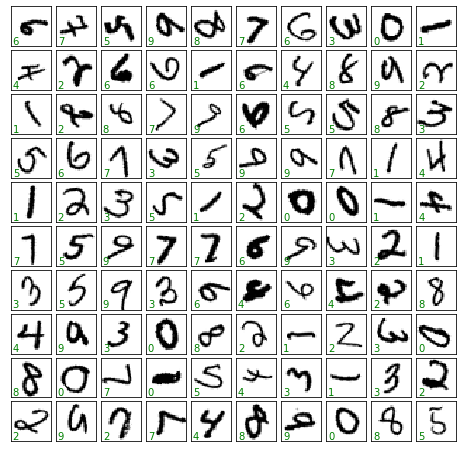

In [ ]:
fig, axes = plt.subplots(10, 10, figsize=(8, 8),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

for ax in axes.flat:
    i = np.random.randint(len(imstack_train))
    ax.imshow(imstack_train[i], cmap='binary', interpolation='nearest')
    ax.text(0.05, 0.05, str(labels_train[i]),
            transform=ax.transAxes, color='green')

We first apply regular VAE to the rotated digits. The result of VAE on the non-rotated MNIST data can be found [elsewhere](https://keras.io/examples/generative/vae/).

In [ ]:
input_dim = (28, 28)

# Intitialize model
vae = aoi.models.VAE(input_dim) 
# Train
vae.fit(imstack_train, training_cycles=100, batch_size=100)

Epoch: 1/100, Training loss: 28.7524
Epoch: 2/100, Training loss: 26.1965
Epoch: 3/100, Training loss: 26.0417
Epoch: 4/100, Training loss: 25.9515
Epoch: 5/100, Training loss: 25.8298
Epoch: 6/100, Training loss: 25.2473
Epoch: 7/100, Training loss: 25.0968
Epoch: 8/100, Training loss: 24.9832
Epoch: 9/100, Training loss: 24.8927
Epoch: 10/100, Training loss: 24.8035
Epoch: 11/100, Training loss: 24.7555
Epoch: 12/100, Training loss: 24.6960
Epoch: 13/100, Training loss: 24.6545
Epoch: 14/100, Training loss: 24.6004
Epoch: 15/100, Training loss: 24.5551
Epoch: 16/100, Training loss: 24.4913
Epoch: 17/100, Training loss: 24.4481
Epoch: 18/100, Training loss: 24.3953
Epoch: 19/100, Training loss: 24.3342
Epoch: 20/100, Training loss: 24.2816
Epoch: 21/100, Training loss: 24.2309
Epoch: 22/100, Training loss: 24.1978
Epoch: 23/100, Training loss: 24.1687
Epoch: 24/100, Training loss: 24.1348
Epoch: 25/100, Training loss: 24.1110
Epoch: 26/100, Training loss: 24.0888
Epoch: 27/100, Traini

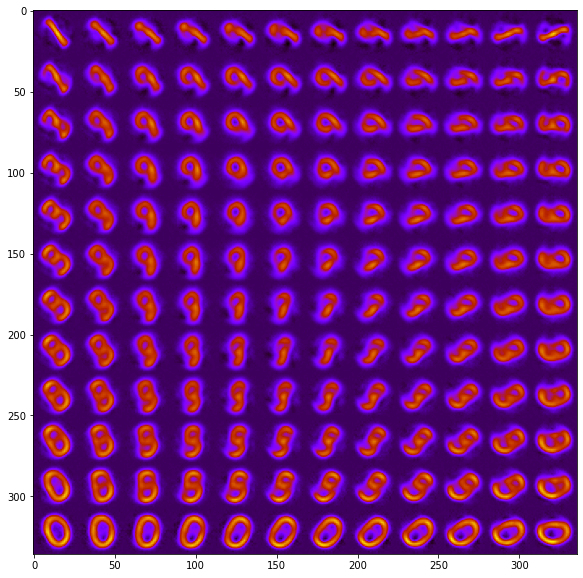

In [ ]:
vae.manifold2d(d=12, origin='upper')

Look like it didn't do a very good job. To tackle this problem and analyze the general imaging data, here we utilize the rotationally
invariant extension of VAE (rVAE). The rVAE represents a special class of VAEs where three of the latent variables are rotation and x- and y-offsets, complemented by classical latent variables associated with image content. Thus, rVAE adds rotational and (in this case) offset invariance to the analysis workflow. In other words, it is expected to recognize the images even if they are shifted and rotated with respect to each other. In this case, the sub-images are used to train the
rVAE, which compresses the n × n image down to 3+m variables, including angle, x offset, y offset, and m non-linear latent variables corresponding to image content.

Initialize and train rVAE model:

In [ ]:
input_dim = (28, 28)

# Intitialize model
rvae = aoi.models.rVAE(input_dim) 
# Train
rvae.fit(imstack_train, rotation_prior=np.pi/4, training_cycles=100, batch_size=100)

Epoch: 1/100, Training loss: 31.1344
Epoch: 2/100, Training loss: 28.4802
Epoch: 3/100, Training loss: 27.9356
Epoch: 4/100, Training loss: 27.6729
Epoch: 5/100, Training loss: 27.3926
Epoch: 6/100, Training loss: 27.1621
Epoch: 7/100, Training loss: 27.0025
Epoch: 8/100, Training loss: 26.8522
Epoch: 9/100, Training loss: 26.7342
Epoch: 10/100, Training loss: 26.5962
Epoch: 11/100, Training loss: 26.4218
Epoch: 12/100, Training loss: 26.1976
Epoch: 13/100, Training loss: 25.9397
Epoch: 14/100, Training loss: 25.6768
Epoch: 15/100, Training loss: 25.4934
Epoch: 16/100, Training loss: 25.3194
Epoch: 17/100, Training loss: 25.1766
Epoch: 18/100, Training loss: 25.0462
Epoch: 19/100, Training loss: 24.9112
Epoch: 20/100, Training loss: 24.7909
Epoch: 21/100, Training loss: 24.6808
Epoch: 22/100, Training loss: 24.5782
Epoch: 23/100, Training loss: 24.4996
Epoch: 24/100, Training loss: 24.4114
Epoch: 25/100, Training loss: 24.3350
Epoch: 26/100, Training loss: 24.2785
Epoch: 27/100, Traini

View results:

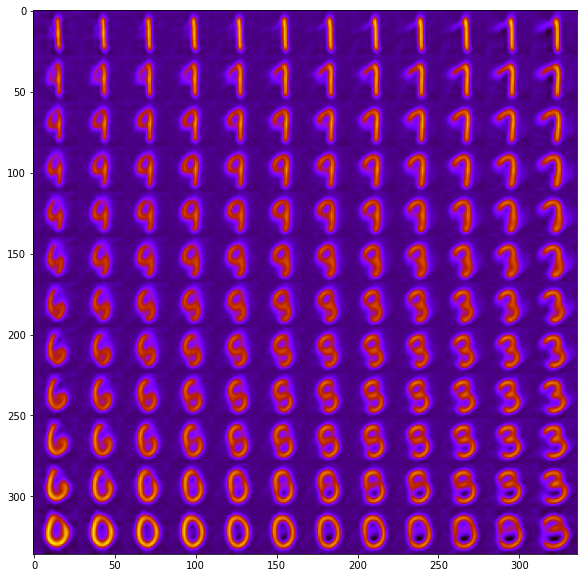

In [ ]:
rvae.manifold2d(d=12, origin='upper')

Looks much better! Now let's train a class-conditioned rVAE.

In [ ]:
input_dim = (28, 28)

# Intitialize model
rvae = aoi.models.rVAE(input_dim, nb_classes=10) 
# Train
rvae.fit(imstack_train, labels_train, rotation_prior=np.pi/2, training_cycles=100, batch_size=100)

Epoch: 1/100, Training loss: 30.2624
Epoch: 2/100, Training loss: 28.1172
Epoch: 3/100, Training loss: 27.7999
Epoch: 4/100, Training loss: 27.6462
Epoch: 5/100, Training loss: 27.4803
Epoch: 6/100, Training loss: 27.3018
Epoch: 7/100, Training loss: 27.1465
Epoch: 8/100, Training loss: 27.0178
Epoch: 9/100, Training loss: 26.8919
Epoch: 10/100, Training loss: 26.7202
Epoch: 11/100, Training loss: 26.4182
Epoch: 12/100, Training loss: 25.9685
Epoch: 13/100, Training loss: 25.5577
Epoch: 14/100, Training loss: 25.1375
Epoch: 15/100, Training loss: 24.7908
Epoch: 16/100, Training loss: 24.4322
Epoch: 17/100, Training loss: 24.1595
Epoch: 18/100, Training loss: 23.8921
Epoch: 19/100, Training loss: 23.6317
Epoch: 20/100, Training loss: 23.4057
Epoch: 21/100, Training loss: 23.2097
Epoch: 22/100, Training loss: 22.9535
Epoch: 23/100, Training loss: 22.7585
Epoch: 24/100, Training loss: 22.5923
Epoch: 25/100, Training loss: 22.4319
Epoch: 26/100, Training loss: 22.2868
Epoch: 27/100, Traini

View results:

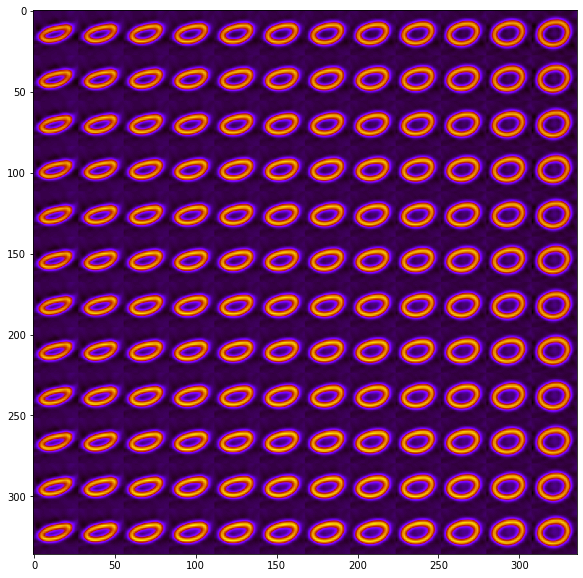

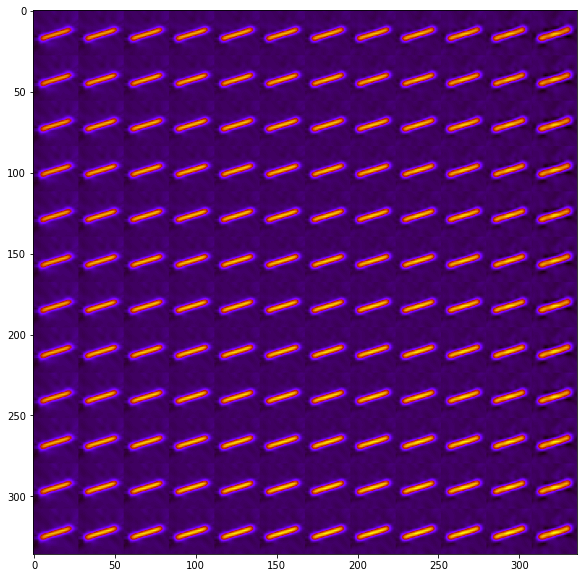

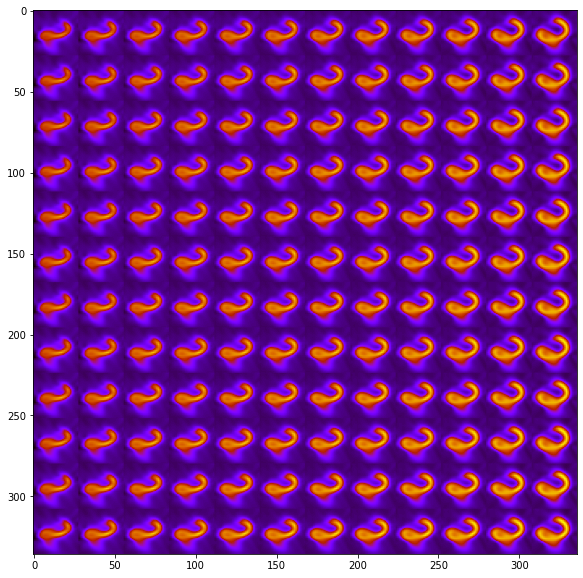

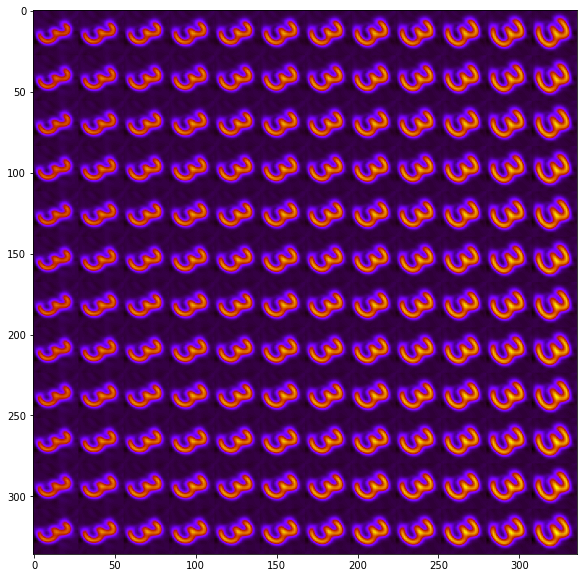

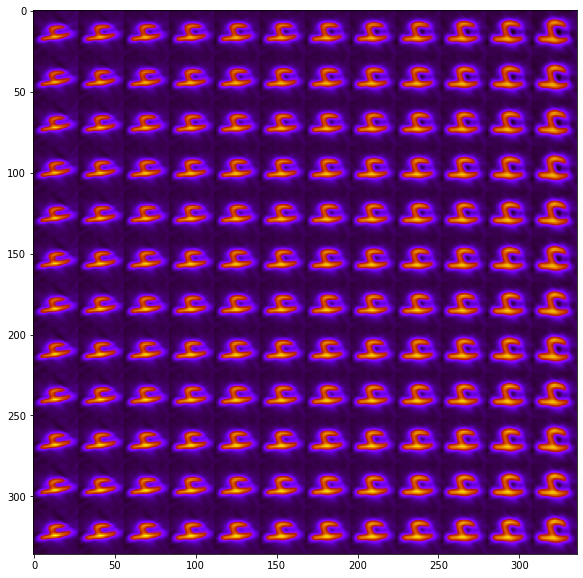

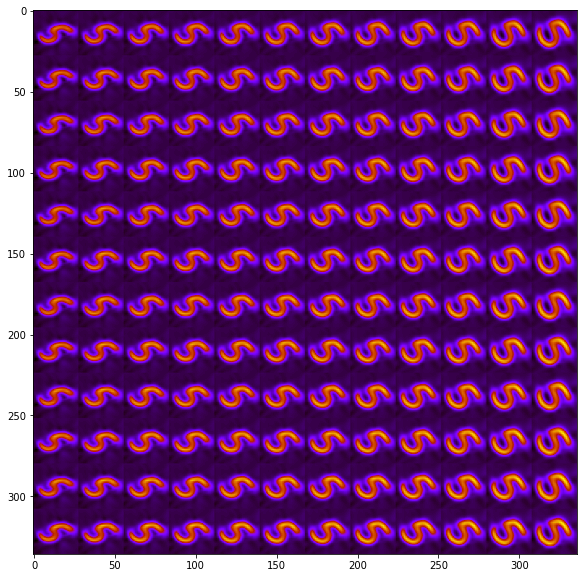

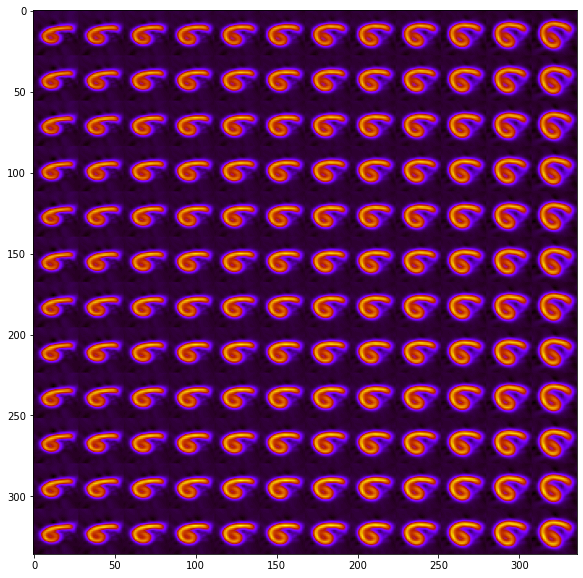

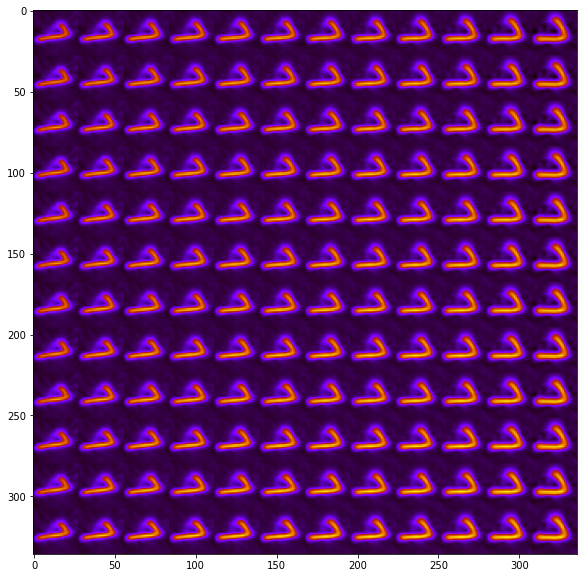

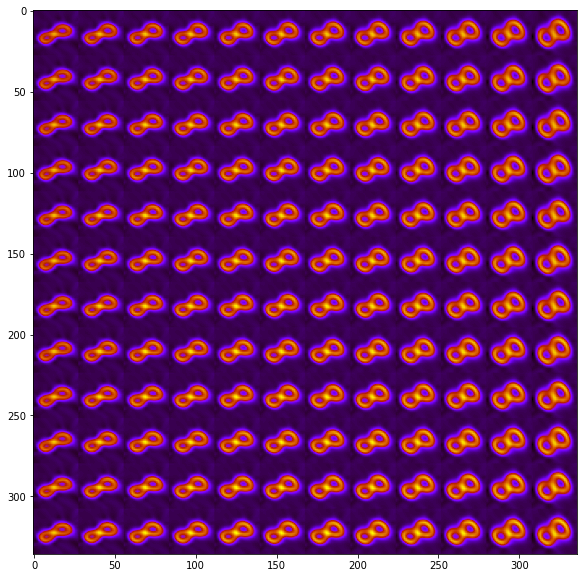

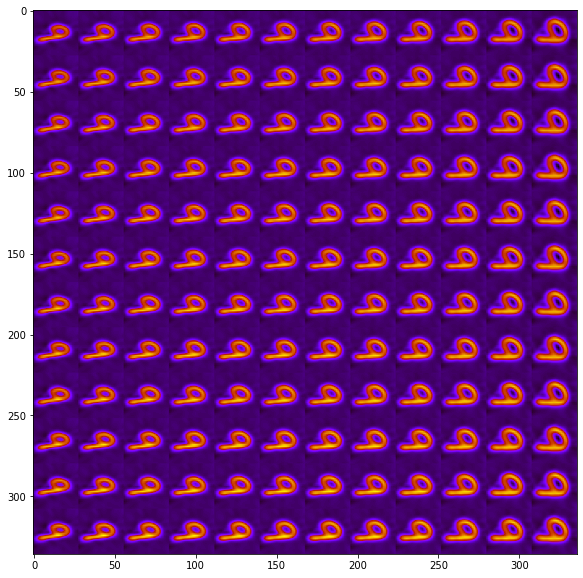

In [ ]:
for i in range(10):
    rvae.manifold2d(label=i, d=12, origin="upper")

Finally, we can run a regular VAE with class conditioning to confirm that it does *not* work (as one would expect):

In [ ]:
input_dim = (28, 28)

# Intitialize model
vae = aoi.models.VAE(input_dim, nb_classes=10) 
# Train
vae.fit(imstack_train, labels_train, training_cycles=100, batch_size=100)

Epoch: 1/100, Training loss: 28.0994
Epoch: 2/100, Training loss: 24.3466
Epoch: 3/100, Training loss: 23.9212
Epoch: 4/100, Training loss: 23.8693
Epoch: 5/100, Training loss: 23.8371
Epoch: 6/100, Training loss: 23.6869
Epoch: 7/100, Training loss: 23.1605
Epoch: 8/100, Training loss: 23.1058
Epoch: 9/100, Training loss: 23.0677
Epoch: 10/100, Training loss: 22.9879
Epoch: 11/100, Training loss: 22.8883
Epoch: 12/100, Training loss: 22.7289
Epoch: 13/100, Training loss: 22.5366
Epoch: 14/100, Training loss: 22.3531
Epoch: 15/100, Training loss: 22.1856
Epoch: 16/100, Training loss: 22.0426
Epoch: 17/100, Training loss: 21.9306
Epoch: 18/100, Training loss: 21.8378
Epoch: 19/100, Training loss: 21.7393
Epoch: 20/100, Training loss: 21.6596
Epoch: 21/100, Training loss: 21.5948
Epoch: 22/100, Training loss: 21.5265
Epoch: 23/100, Training loss: 21.4652
Epoch: 24/100, Training loss: 21.4030
Epoch: 25/100, Training loss: 21.3335
Epoch: 26/100, Training loss: 21.2787
Epoch: 27/100, Traini

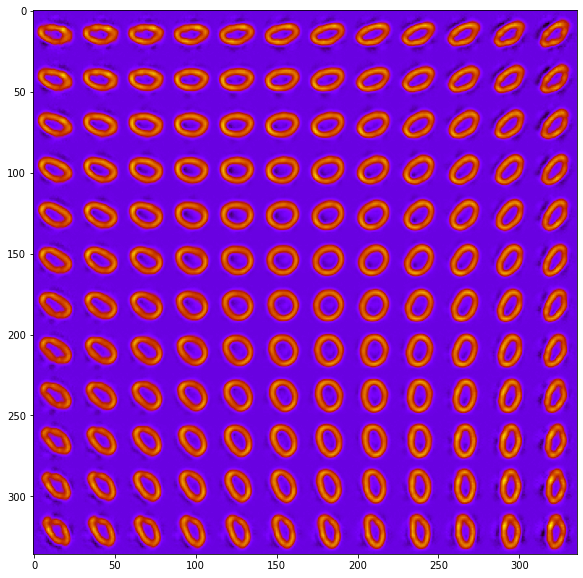

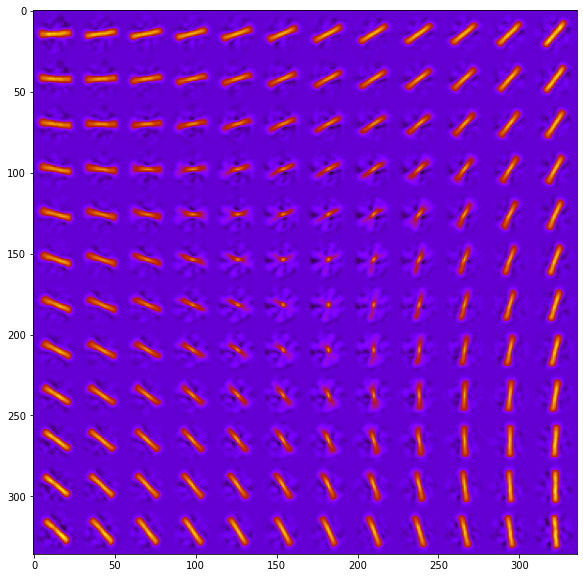

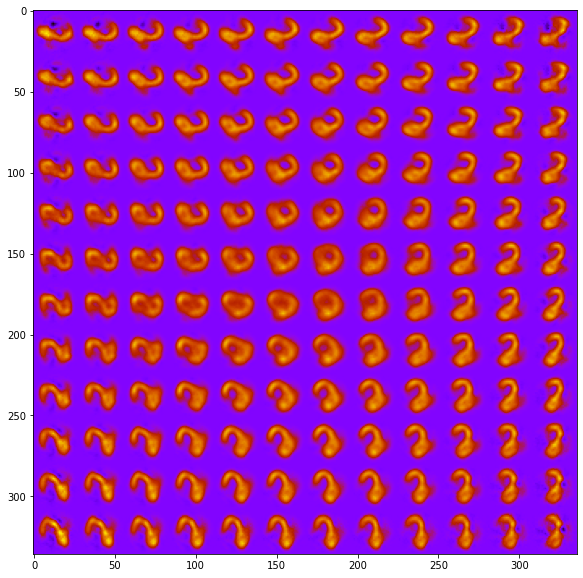

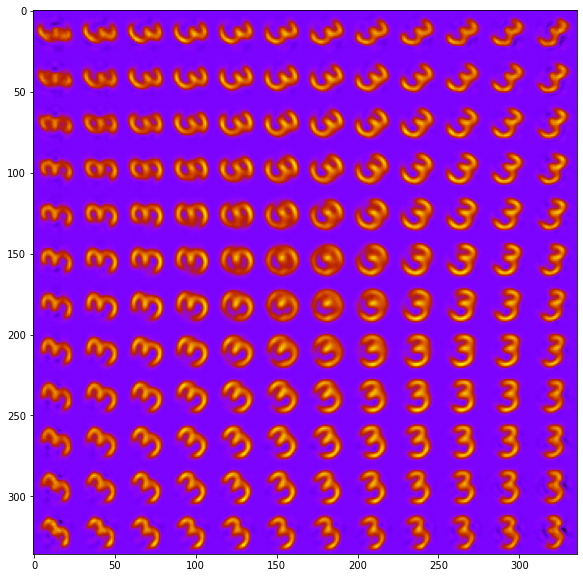

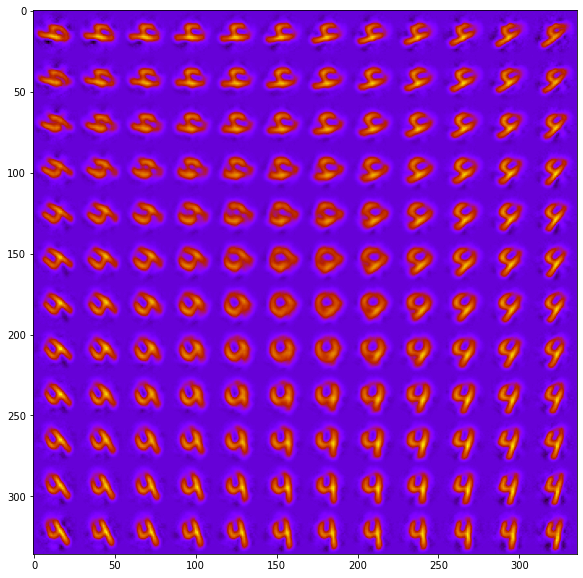

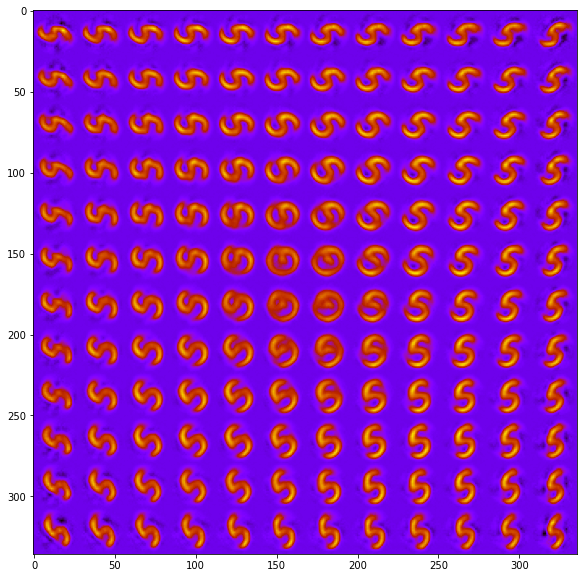

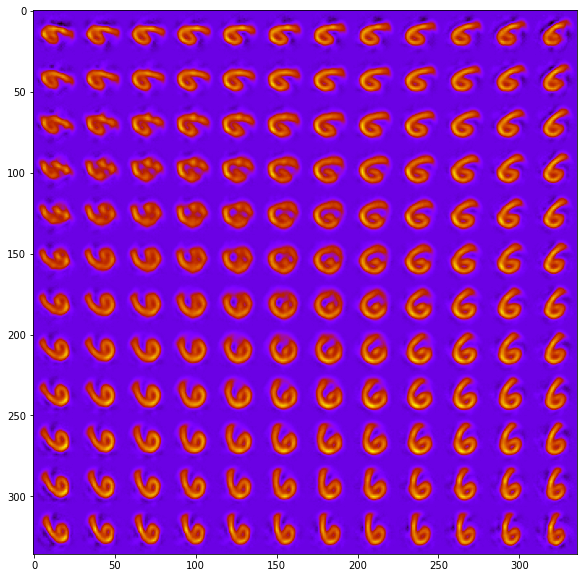

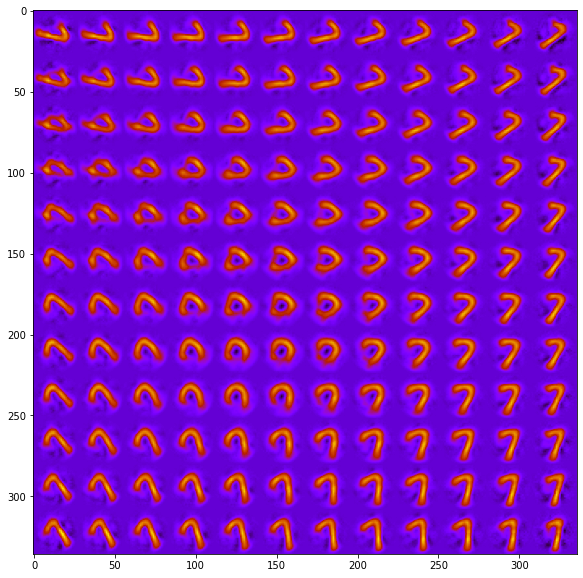

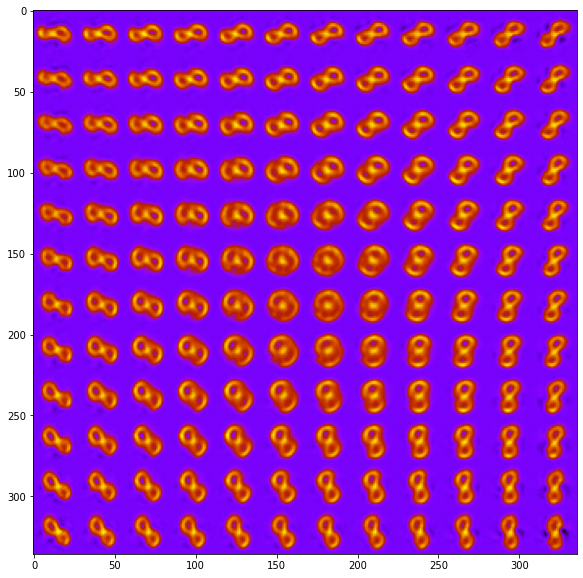

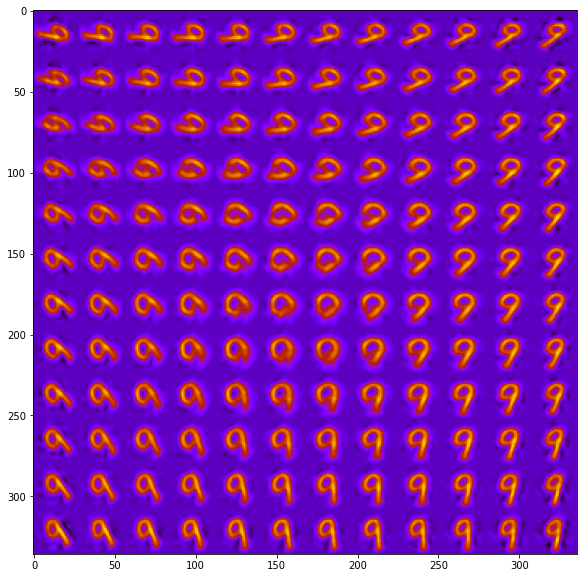

In [ ]:
for i in range(10):
    vae.manifold2d(label=i, d=12, origin="upper")